# "jikkenr160_4_8_16" VRSJ AC 2020
Plot


Masahiro Furukawa

Sept 2, 2020

Opti Track Coordination from Hirayama

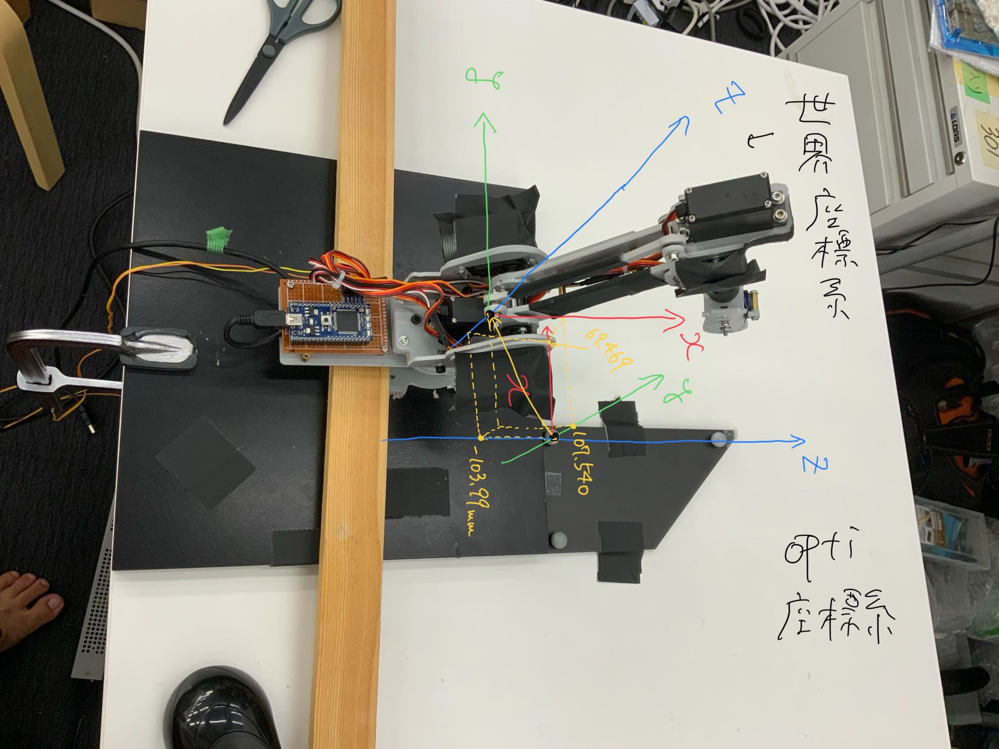

Coordination : Right Hand


Robot : +X(to Front), +Y(to Left), +Z(to Top)
    
Opti : +Z(to Front), +X(to Left), +Y(to Top)

9692


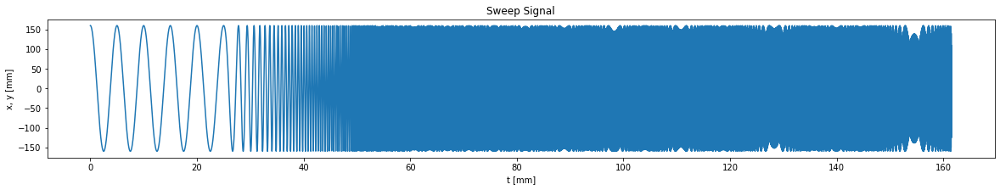

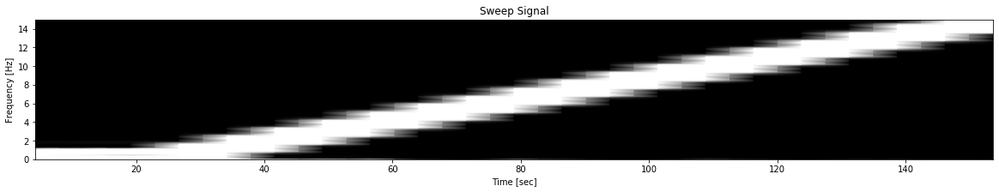

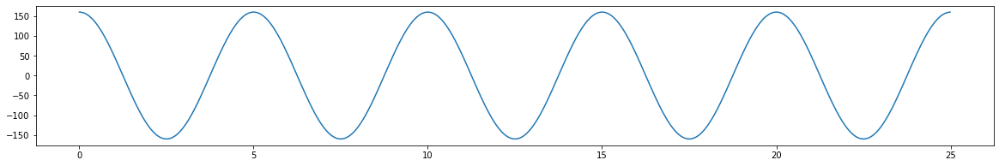

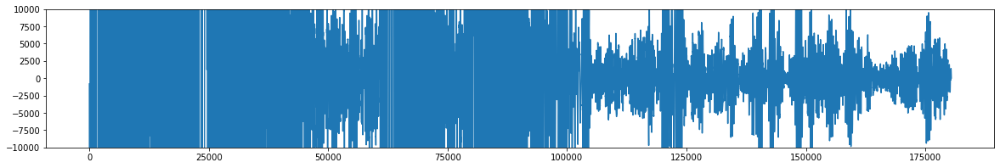

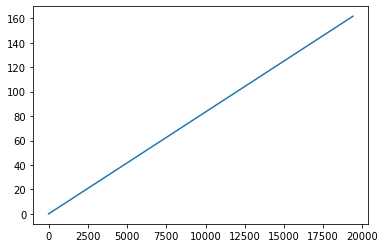

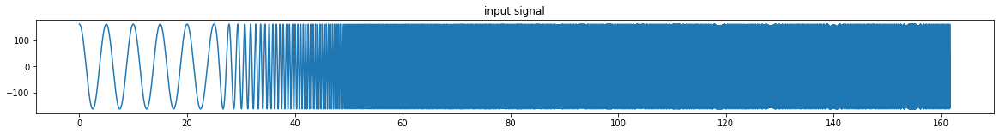

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import correlate

df =  pd.read_csv("./jikkenr160_0902.csv", header = 0, skiprows = 6)
sw =  pd.read_csv("./r160_f80_f02_P81newsweep.csv",names=('x', 'y'))

df['X(mm)'] = df['X']*1000.0
df['Y(mm)'] = df['Y']*1000.0
df['Z(mm)'] = df['Z']*1000.0

fps_sweep = 60
n=len(sw['x'])
print(n)
t=np.linspace(0,n,n)/fps_sweep
plt.figure(figsize=(20,3))
plt.plot(t,sw['x'])
plt.title('Sweep Signal')
plt.xlabel('t [mm]')
plt.ylabel('x, y [mm]')

plt.figure(figsize=(20,3))
f,t_,Sxx = signal.spectrogram(sw['x'], fps_sweep, nperseg=512)
ax = plt.gca()
ax.pcolormesh(t_, f, Sxx,vmax=1e+1, vmin=1e-17, shading='gouraud', cmap='gray') #coolwarm jet gray 
ax.set_ylim([0,fps_sweep/4])
plt.title('Sweep Signal')
ax.set_xlabel(u'Time [sec]')
ax.set_ylabel(u'Frequency [Hz]')

plt.figure(figsize=(20,3))
cx = df['X(mm)'] - np.mean(df['X(mm)'])
cy = sw['x'][:fps_sweep * 5 * 5] - np.mean(sw['x'][:fps_sweep * 5 * 5])
ct = t[:fps_sweep * 5 * 5]
plt.plot(ct,cy)

plt.figure(figsize=(20,3))
plt.plot(correlate( cx, cy))
plt.ylim([-10000,10000])

plt.show()



# ===========-sweep曲線を作成する========
# Hirayama said;
# sweep信号については条件を変えました。(共有忘れていました)
# fmax:8.0Hzfmin0.2Hz、データ数は8196+冒頭分です。
# 冒頭25秒間は0.2Hzで運動させて、そこからsweep曲線が送られます。

r = 160 # [mm]

f_max =       8  #  Hz
f_min =     0.2  #  Hz
dulation_s = 25  # s

fps_opti =   120 # Hz

ns = fps_opti * dulation_s 
n  = 8196 * 2         # 8196 @ 60 fps = 8196 * 2 @ 120fps 

delta_f = (f_max - f_min) / n

t1 = np.linspace(0, ns, ns) / fps_opti
t2 = np.linspace(0, n, n) / fps_opti + dulation_s
tsx = np.append(t1,t2)
# (単位円の半径r)*(PI)*(時刻tにおける振動数f)*(時刻t)
sx120=[]
sx120 = r * np.cos(2.0 * np.pi *  f_min * tsx[:ns])
sx120s= r * np.cos(2.0 * np.pi * (f_min + delta_f * np.linspace(0,n,n)) * np.linspace(0,n,n)/fps_opti)
sx120 = np.append(sx120, sx120s)
plt.figure(figsize=(20,2))
plt.plot(tsx, sx120)
plt.title('input signal')
plt.show()


178928


C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


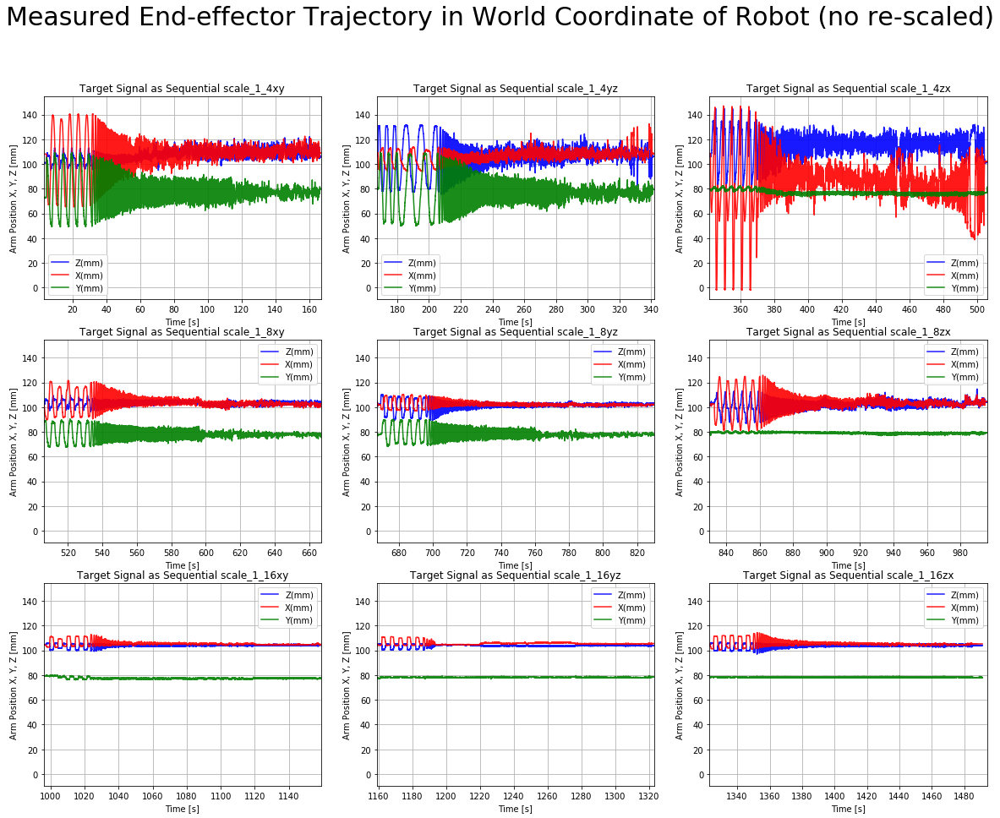

C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\ipykernel_launcher.py:238: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


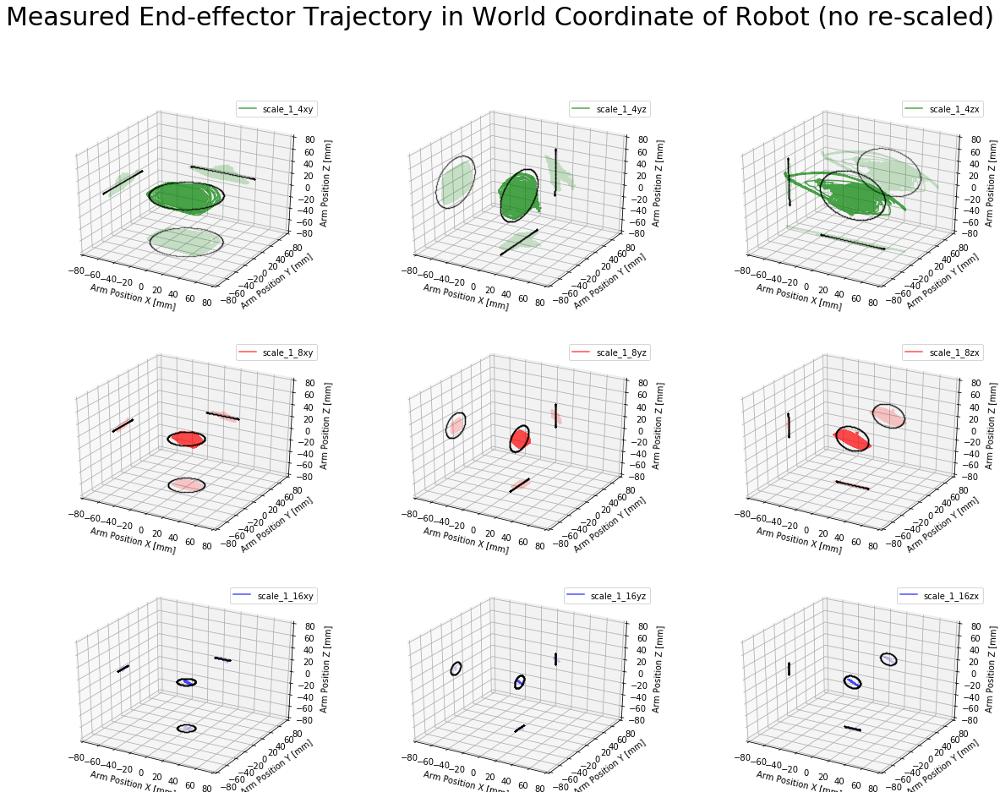

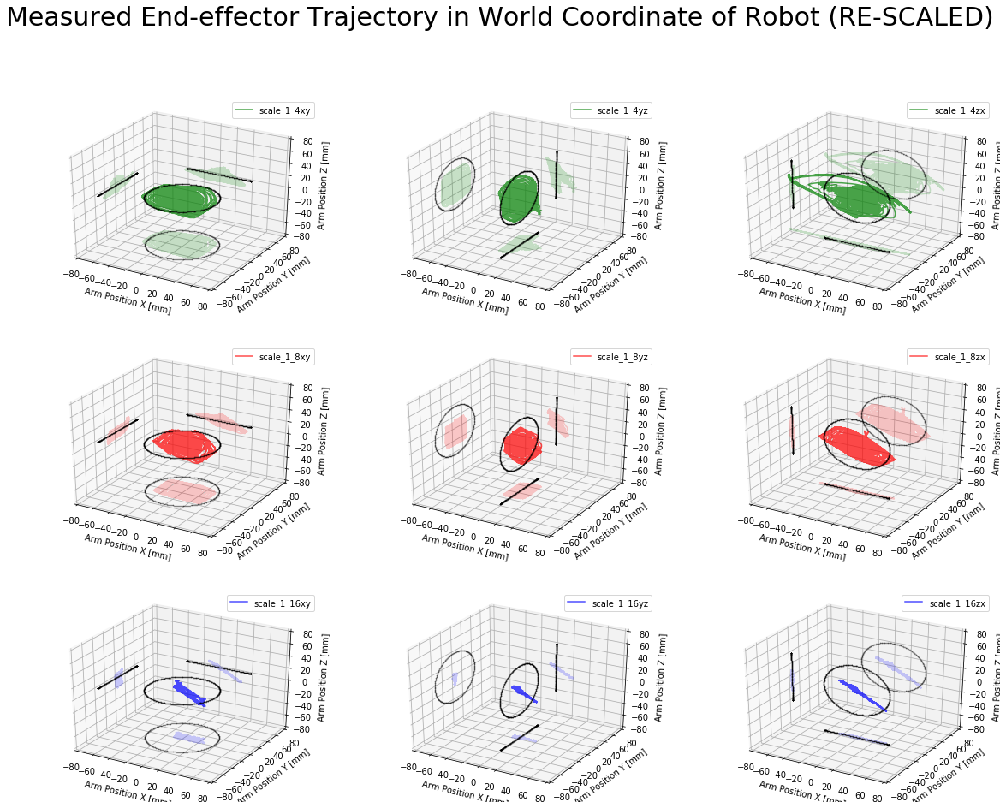

C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


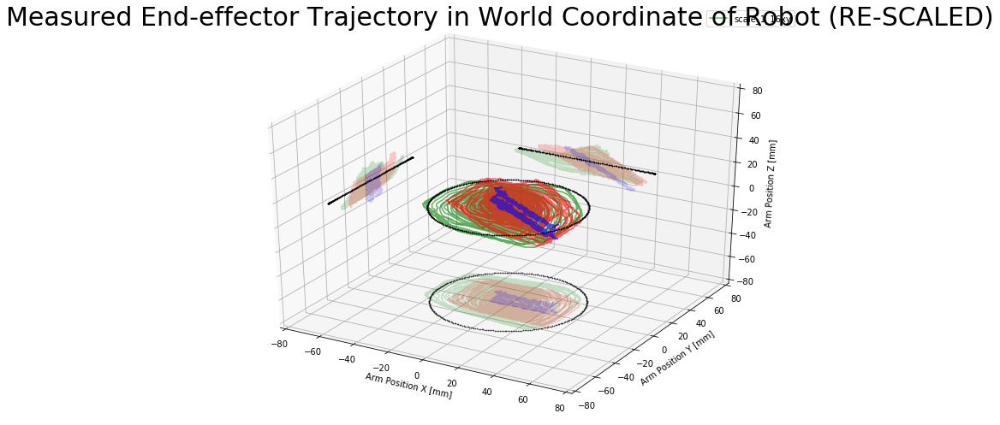

In [156]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

        
def setname(i):
    # implemented from 
    # https://github.com/maeda-lab/Scaledown/blob/master/simulation/simulation_realtime_Ji_sending/Source.cpp

    # Order of names created... 1/4xy,yz,zx 1/8xy,yz,zx  1/16xy,yz,zx
    # by using "if" ,"%",and "/"
    
    name = 'scale_'

    # C++ source might have bug
    # the following arrangement should be correct
    # Masahiro Furukawa
    if i % 3 == 0:
        space = "xy" 
        movespace = 0
    elif i % 3 == 1:
        space = "yz"
        movespace = 1
    else:
        space = "zx"
        movespace = 2

    if int(i / 3) == 0: 
        scalesize = "1_4"
        scale = 0.25
        c = 'g'
    elif int(i / 3) == 1:
        scalesize = "1_8"
        scale = 0.125
        c = 'r'
    else:
        scalesize = "1_16"
        scale = 0.0625
        c = 'b'

    return (name + scalesize + space , scale, c)

def Coordination_Opti2Robot(x,y,z):
    
    #    Robot : +X(to Front), +Y(to Left), +Z(to Top)
    # **  Opti : +Z(to Front), +X(to Left), +Y(to Top)
    
    return (z, x, y)

def prep_axis(ax, str, ssx, ssy, ssn, key_x):
    ax.plot(ssx, ssy, ssn, 'k.', alpha=0.2, label= key_x, markersize=1)
    ax.plot(ssx, ssn, 'k.', zdir='y', zs= 80  ,alpha=0.1, markersize=1)
    ax.plot(ssy, ssn, 'k.', zdir='x', zs=-80  ,alpha=0.1, markersize=1)
    ax.plot(ssx, ssy, 'k.', zdir='z', zs=-80  ,alpha=0.1, markersize=1)        
    ax.set_xlabel('Arm Position X [mm]')
    ax.set_ylabel('Arm Position Y [mm]')
    ax.set_zlabel('Arm Position Z [mm]')
    ax.set_xlim([-80, 80])
    ax.set_ylim([-80, 80])
    ax.set_zlim([-80, 80])
    ax.legend([str])

def plot_One(key_x, key_y, key_z):   
    
    fps_opti = 120 
    n = len(df[key_x])
    t = np.linspace(0,n,n)/fps_opti
    print(n)
    
    deltaSec = 160
    plotSec = 10
    
    nTrial = int(n/deltaSec/fps_opti)
 
    alpha = 0.2
    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
    
    for s in range(nTrial):
        
        str,_,_ = setname(s)
        
        (x,y,z) = Coordination_Opti2Robot(df[key_x], df[key_y], df[key_z])
        
        plt.subplot(3,3,s+1)
        plt.plot(t, z,'b-',alpha=0.9,label = key_z, markersize=3)
        plt.plot(t, x,'r-',alpha=0.9,label = key_x, markersize=3)
        plt.plot(t, y,'g-',alpha=0.9,label = key_y, markersize=3)
        plt.title('Target Signal as Sequential ' + str)
        plt.xlabel('Time [s]')
        plt.ylabel('Arm Position X, Y, Z [mm]')
#         plt.ylim([0,10])
        ts = start_in_sec[s]
        te = start_in_sec[s+1]
        plt.xlim([ts, te])
        plt.legend()
        plt.grid(True)
    
    plt.show()

    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps_opti
        es = start_in_sec[s+1] *fps_opti
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) )
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) 
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) )
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)


        sx = sw['x'][:plotSec*fps_opti] * scale
        sy = sw['y'][:plotSec*fps_opti] * scale    
        sn = np.zeros(len(sx))

        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy

        prep_axis(ax, str, ssx, ssy, ssn, key_x)

    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps_opti
        es = start_in_sec[s+1] *fps_opti
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)
        
        sx = sw['x'][:plotSec*fps_opti]  / 4.0
        sy = sw['y'][:plotSec*fps_opti]  / 4.0
        sn = np.zeros(len(sx))

        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        prep_axis(ax, str, ssx, ssy, ssn, key_x)

    fig = plt.figure(figsize=(10,7))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    ax = fig.add_subplot(111, projection='3d')
    
    for s in [0,3,6]:
        
        str, scale, c = setname(s)
        
        ss = start_in_sec[s]   *fps_opti
        es = start_in_sec[s+1] *fps_opti
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax.plot(x, y, z, c, alpha=0.6, label=str)

        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)

        sx = sw['x'][:plotSec*fps_opti] / 4.0
        sy = sw['y'][:plotSec*fps_opti] / 4.0
        sn = np.zeros(len(sx))
        
        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy       

        prep_axis(ax, str, ssx, ssy, ssn, key_x)

    plt.tight_layout()
    plt.show()
    
start_in_sec = [3, 167, 166*2+10, 166*3+8, 166*4+3, 166*5, 166*6, 166*7-3, 166*8-5, 166*9] # correct @ 120fps
    
plot_One('X(mm)', 'Y(mm)', 'Z(mm)')

C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Masahiro Furukawa\.conda\envs\python3.7\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume t

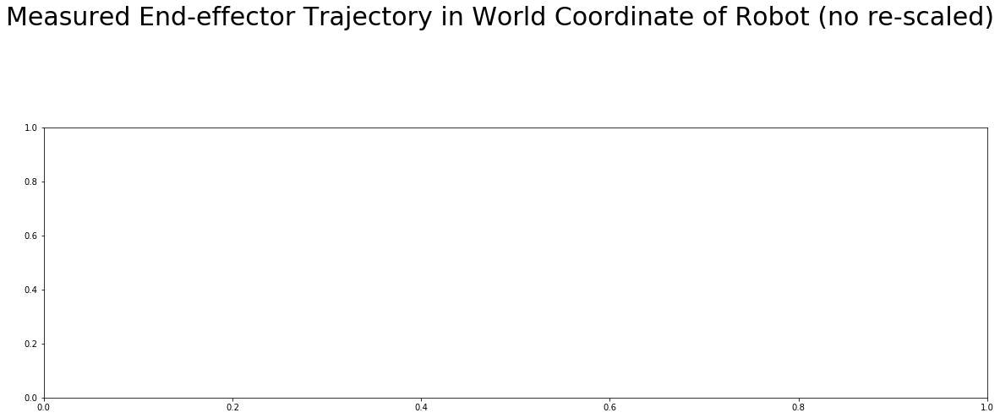

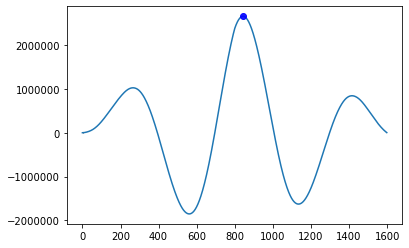

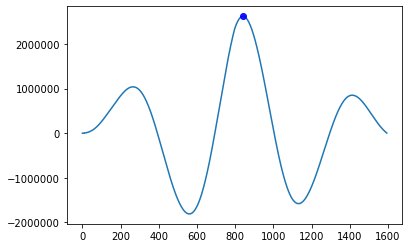

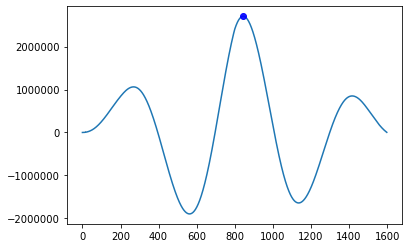

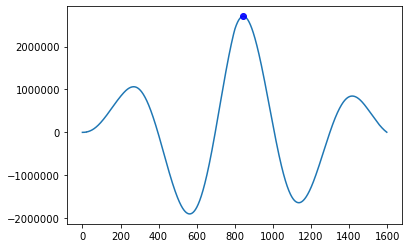

...

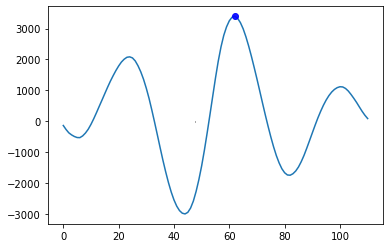

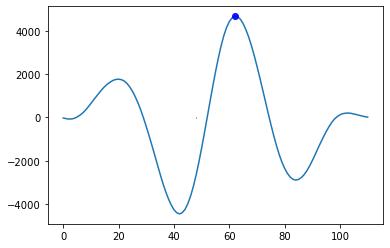

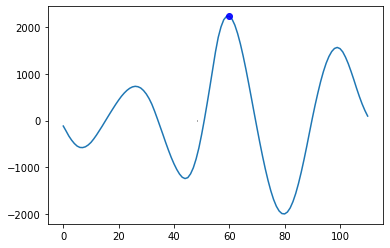

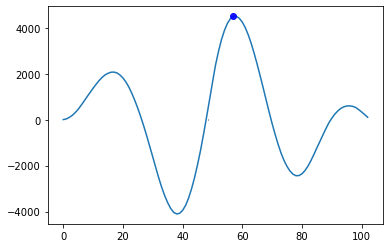

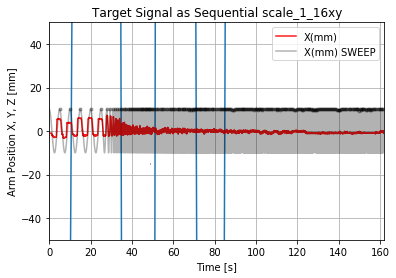

In [155]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from scipy.signal import find_peaks
from scipy.signal import correlate

#    Robot : +X(to Front), +Y(to Left), +Z(to Top)
# **  Opti : +Z(to Front), +X(to Left), +Y(to Top)
def Coordination_Opti2Robot(x,y,z):
    return (z, x, y)

def plot_One(key_x, key_y, key_z):   
    
    fps_opti = 120
    n = len(df[key_x])
    t = np.linspace(0,n,n)/fps_opti
    
    deltaSec = 162
    
    nTrial = int(n/deltaSec/fps_opti)
 
    alpha = 0.2
    
    fig = plt.figure(figsize=(20,20))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
    
    (x,y,z) = Coordination_Opti2Robot(df[key_x], df[key_y], df[key_z])

    for s in [0, 3, 6]:        
        str,scale,_ = setname(s)

        ts = start_in_sec[s]
        te = ts + deltaSec
        
        xx = list(x[ts*fps_opti : te*fps_opti])
        xx = xx - np.mean(xx)
        
        t  = np.linspace(0,len(xx),len(xx))/fps_opti
        ts = np.linspace(0,len(sx120),len(sx120))/fps_opti
        
        peaks_xx, _ = find_peaks(xx,    distance=40)
        peaks_sx, _ = find_peaks(sx120, distance=40)
#         acf = correlate(x,x)[acTSec*fs:]

        plt.subplot(3,1,int(s/3)+1)
    
        for i, pi in enumerate(peaks_sx):
            if i == 0 or pi > 6000: 
                continue
                
            w = int((peaks_sx[i] - peaks_sx[i-1])/1.5)
            pis = -w + peaks_sx[i-1]
            pie =  w + peaks_sx[i-1]
            cor = correlate(xx[pis:pie], sx120[pis:pie])
            ic = np.argmax(cor)
            
            plt.figure()
            plt.plot(cor)
            plt.plot(ic, cor[ic], 'bo', alpha=0.9, markersize=6)
#             print(i,pi,peaks_sx[i] - peaks_sx[i-1],t[pis],t[pie])
#             plt.plot(t[ic+pis] ,xx[ic+pis], 'bo', alpha=0.9, markersize=6)
            plt.hlines(t[pis]/10-20, t[pis], t[pie], 'gray', alpha=0.9)
#             print(i, cor[i], cor)

            if i == 1: 
                dfix = ts[ic]
            
        plt.plot(t           , xx,                   'r-', alpha=0.9, label = key_x,          markersize=2)
        plt.plot(ts          , sx120*scale,          'k-', alpha=0.3, label = key_x+' SWEEP', markersize=3)
        plt.plot(ts[peaks_sx], sx120[peaks_sx]*scale,'ko', alpha=0.3,                         markersize=3)
        
        plt.title('Target Signal as Sequential ' + str)
        plt.xlabel('Time [s]')
        plt.ylabel('Arm Position X, Y, Z [mm]')
        plt.xlim([0,deltaSec])
        plt.ylim([-50,50])
        plt.legend()
        plt.grid(True)


#     plt.tight_layout()
    plt.show()
    
plot_One('X(mm)', 'Y(mm)', 'Z(mm)')

In [125]:
# Masahiro Furukawa
# Aug 31, 2020

# Spectrogram

## coding:utf-8
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
from scipy import fftpack

def plot_Spec(key_x, key_y, key_z):
    
    for s in [0,3,6]:

        fps_opti = 60
        deltaSec = 53
        
        str, scale, c = setname(s)

        ss = s*deltaSec*fps_opti
        es = (s+1)*deltaSec*fps_opti

        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)

        fig = plt.figure(figsize=(10,4))

        vmx = [1e-9, 5*1e-7]
        vmn = [1e-11, 1e-8]

        # spectrogram
        f,t_,Sxx = signal.spectrogram(x, fps_opti, nperseg=128)
        ax = plt.gca()
        ax.pcolormesh(t_, f, Sxx,vmax=1e+1, vmin=1e-17, shading='gouraud', cmap='gray') #coolwarm jet gray 
        # ax.set_xlim([150,400])
        ax.set_ylim([0,fps_opti/4])
        ax.set_title(str)
        ax.set_xlabel(u'Time [sec]')
        ax.set_ylabel(u'Frequency [Hz]')

plot_Spec('x(mm)', 'y(mm)', 'z(mm)')

KeyError: 'x(mm)'